<font color="green">*To start working on this notebook, or any other notebook that we will use in the Moringa Data Science Course, we will need to save our own copy of it. We can do this by clicking File > Save a Copy in Drive. We will then be able to make edits to our own copy of this notebook.*</font>

# Python Programming: Naive Bayes - Exploratory Data Analysis

## 1. Defining the Question

### a) Specifying the Data Analytic Question

> This week's project requires us to implement a K-nearest neighbor (kNN) classifier  and a Naive Bayes classifier. Once we conduct the experiments, we will calculate the resulting metrics:

### b) Defining the Metric for Success

> The metric of success requires us to implement a K-nearest neighbor (kNN) classifier and a Naive Bayes classifier.

### c) Understanding the context 

### d) Recording the Experimental Design

### e) Data Relevance

## 2. Reading the Data

In [102]:
# Import the necessary libraries
#
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB

In [103]:
# Loading the Data from the source i.e. csv
# ---
# Dataset source = Dataset source = http://bit.ly/DiabetesDataSource
# ---
#
spam = pd.read_csv("spambase_csv.csv")
spam.columns

Index(['word_freq_make', 'word_freq_address', 'word_freq_all', 'word_freq_3d',
       'word_freq_our', 'word_freq_over', 'word_freq_remove',
       'word_freq_internet', 'word_freq_order', 'word_freq_mail',
       'word_freq_receive', 'word_freq_will', 'word_freq_people',
       'word_freq_report', 'word_freq_addresses', 'word_freq_free',
       'word_freq_business', 'word_freq_email', 'word_freq_you',
       'word_freq_credit', 'word_freq_your', 'word_freq_font', 'word_freq_000',
       'word_freq_money', 'word_freq_hp', 'word_freq_hpl', 'word_freq_george',
       'word_freq_650', 'word_freq_lab', 'word_freq_labs', 'word_freq_telnet',
       'word_freq_857', 'word_freq_data', 'word_freq_415', 'word_freq_85',
       'word_freq_technology', 'word_freq_1999', 'word_freq_parts',
       'word_freq_pm', 'word_freq_direct', 'word_freq_cs', 'word_freq_meeting',
       'word_freq_original', 'word_freq_project', 'word_freq_re',
       'word_freq_edu', 'word_freq_table', 'word_freq_conference',




## 3. Checking the Data

In [104]:
# Determining the no. of records in our dataset
#
spam.shape

(4601, 58)

In [105]:
# Previewing the top of our dataset
#
spam.head()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
0,0.00,0.64,0.64,0.0,0.32,0.00,0.00,0.00,0.00,0.00,0.00,0.64,0.00,0.00,0.00,0.32,0.00,1.29,1.93,0.00,0.96,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.000,0.0,0.778,0.000,0.000,3.756,61,278,1
1,0.21,0.28,0.50,0.0,0.14,0.28,0.21,0.07,0.00,0.94,0.21,0.79,0.65,0.21,0.14,0.14,0.07,0.28,3.47,0.00,1.59,0.0,0.43,0.43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.07,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.132,0.0,0.372,0.180,0.048,5.114,101,1028,1
2,0.06,0.00,0.71,0.0,1.23,0.19,0.19,0.12,0.64,0.25,0.38,0.45,0.12,0.00,1.75,0.06,0.06,1.03,1.36,0.32,0.51,0.0,1.16,0.06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.06,0.0,0.0,0.12,0.0,0.06,0.06,0.0,0.0,0.01,0.143,0.0,0.276,0.184,0.010,9.821,485,2259,1
3,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.137,0.0,0.137,0.000,0.000,3.537,40,191,1
4,0.00,0.00,0.00,0.0,0.63,0.00,0.31,0.63,0.31,0.63,0.31,0.31,0.31,0.00,0.00,0.31,0.00,0.00,3.18,0.00,0.31,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.135,0.0,0.135,0.000,0.000,3.537,40,191,1


In [106]:
# Previewing the bottom of our dataset
# 
spam.tail()

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
4596,0.31,0.0,0.62,0.0,0.00,0.31,0.0,0.0,0.0,0.0,0.0,1.88,0.00,0.0,0.0,0.0,0.0,0.0,0.62,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.31,0.31,0.31,0.0,0.0,0.000,0.232,0.0,0.000,0.0,0.0,1.142,3,88,0
4597,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,6.00,0.0,2.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,2.00,0.0,0.0,0.000,0.000,0.0,0.353,0.0,0.0,1.555,4,14,0
4598,0.30,0.0,0.30,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,1.80,0.30,0.0,0.0,0.0,0.0,0.9,1.50,0.0,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,1.20,0.0,0.0,0.102,0.718,0.0,0.000,0.0,0.0,1.404,6,118,0
4599,0.96,0.0,0.00,0.0,0.32,0.00,0.0,0.0,0.0,0.0,0.0,0.32,0.00,0.0,0.0,0.0,0.0,0.0,1.93,0.0,0.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.32,0.00,0.32,0.0,0.0,0.000,0.057,0.0,0.000,0.0,0.0,1.147,5,78,0
4600,0.00,0.0,0.65,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.65,0.0,0.0,0.0,0.0,0.0,4.60,0.0,0.65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1.97,0.65,0.0,0.0,0.000,0.000,0.0,0.125,0.0,0.0,1.250,5,40,0


In [107]:
# Checking whether each column has an appropriate datatype
#
spam.dtypes

word_freq_make                float64
word_freq_address             float64
word_freq_all                 float64
word_freq_3d                  float64
word_freq_our                 float64
word_freq_over                float64
word_freq_remove              float64
word_freq_internet            float64
word_freq_order               float64
word_freq_mail                float64
word_freq_receive             float64
word_freq_will                float64
word_freq_people              float64
word_freq_report              float64
word_freq_addresses           float64
word_freq_free                float64
word_freq_business            float64
word_freq_email               float64
word_freq_you                 float64
word_freq_credit              float64
word_freq_your                float64
word_freq_font                float64
word_freq_000                 float64
word_freq_money               float64
word_freq_hp                  float64
word_freq_hpl                 float64
word_freq_ge

## 4. External Data Source Validation

Making sure your data matches something outside of the dataset is very important. It allows you to ensure that the measurements are roughly in line with what they should be and it serves as a check on what other things might be wrong in your dataset. External validation can often be as simple as checking your data against a single number, as we will do here.

An example would be suppose that you're working with a dataset on the population of countries during the year 2016. Validating such information with an external reliable resource such as World Bank Data would be important step to providing credibility to your dataset. Have a look at the following link for an example. [Link](https://rstudio-pubs-static.s3.amazonaws.com/182250_19977d0c5c06403fbad1e653850fc7c6.html).

### a.Validation

## 5. Tidying the Dataset

In [108]:
# Define the numeric columns
#
numeric = spam[['word_freq_make', 'word_freq_address', 'word_freq_all', 'word_freq_3d',\
                'word_freq_our', 'word_freq_over', 'word_freq_remove',\
                'word_freq_internet', 'word_freq_order', 'word_freq_mail',\
                'word_freq_receive', 'word_freq_will', 'word_freq_people',\
                'word_freq_report', 'word_freq_addresses', 'word_freq_free',\
                'word_freq_business', 'word_freq_email', 'word_freq_you',\
                'word_freq_credit', 'word_freq_your', 'word_freq_font', 'word_freq_000',\
                'word_freq_money', 'word_freq_hp', 'word_freq_hpl', 'word_freq_george',\
                'word_freq_650', 'word_freq_lab', 'word_freq_labs', 'word_freq_telnet',\
                'word_freq_857', 'word_freq_data', 'word_freq_415', 'word_freq_85',\
                'word_freq_technology', 'word_freq_1999', 'word_freq_parts',\
                'word_freq_pm', 'word_freq_direct', 'word_freq_cs', 'word_freq_meeting',\
                'word_freq_original', 'word_freq_project', 'word_freq_re',\
                'word_freq_edu', 'word_freq_table', 'word_freq_conference',\
                'char_freq_%3B', 'char_freq_%28', 'char_freq_%5B', 'char_freq_%21',\
                'char_freq_%24', 'char_freq_%23', 'capital_run_length_average',\
                'capital_run_length_longest', 'capital_run_length_total', 'class']]

 Ourtliers:
 [[0.21, 0.06, 0.15, 0.06, 0.05, 0.05, 1.17, 0.3, 0.15, 0.18, 0.49, 0.46, 0.46, 0.73, 0.06, 0.73, 0.23, 0.12, 0.66, 0.3, 0.75, 0.06, 0.47, 0.59, 0.59, 0.46, 1.24, 0.12, 0.05, 0.05, 0.05, 0.05, 0.5, 0.16, 0.5, 0.41, 1.0, 1.0, 0.5, 1.0, 0.36, 0.39, 0.67, 0.42, 0.46, 0.14, 0.46, 0.62, 0.52, 0.17, 0.44, 0.34, 0.34, 0.43, 0.44, 2.12, 0.17, 0.54, 0.17, 0.53, 0.51, 0.43, 0.45, 0.22, 0.34, 0.54, 0.07, 0.07, 0.17, 0.46, 1.03, 0.26, 0.19, 0.46, 0.16, 0.84, 0.17, 0.08, 0.48, 0.48, 0.8, 0.07, 0.14, 0.58, 0.14, 0.14, 0.25, 0.4, 0.18, 0.1, 0.17, 0.08, 0.54, 1.63, 0.35, 0.34, 0.64, 0.64, 0.18, 0.25, 0.64, 0.63, 0.65, 0.19, 0.08, 0.64, 0.18, 0.48, 0.05, 0.2, 0.35, 0.6, 0.08, 0.18, 0.18, 0.76, 0.08, 0.08, 0.6, 0.76, 0.11, 1.05, 0.29, 0.08, 0.1, 0.25, 0.08, 0.14, 0.62, 0.16, 0.51, 0.33, 0.49, 0.33, 0.6, 0.59, 0.27, 0.33, 0.12, 0.12, 0.31, 0.21, 0.09, 0.1, 0.65, 0.09, 0.1, 0.08, 0.25, 0.1, 0.23, 0.51, 0.08, 0.4, 0.32, 0.35, 0.51, 0.53, 0.26, 0.31, 0.09, 0.14, 0.14, 0.5, 0.57, 0.59, 0.19, 0.9,

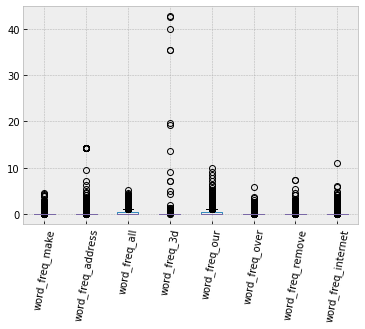

In [109]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, :8], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.64, 0.31, 0.31, 0.92, 0.06, 0.31, 0.55, 0.55, 0.6, 0.06, 0.43, 0.36, 0.06, 0.36, 1.26, 0.75, 0.67, 0.44, 0.56, 0.56, 0.25, 0.1, 0.1, 1.28, 0.1, 0.1, 0.57, 0.16, 0.82, 0.57, 0.54, 1.31, 0.52, 0.08, 0.08, 0.08, 0.11, 0.08, 0.08, 0.22, 0.08, 0.15, 0.15, 0.62, 0.48, 0.54, 0.5, 0.84, 0.08, 0.67, 0.47, 0.63, 0.24, 0.27, 0.27, 0.07, 0.63, 1.17, 1.17, 1.17, 0.25, 0.47, 0.58, 0.2, 0.91, 0.61, 0.06, 0.1, 0.17, 0.25, 0.06, 1.63, 0.37, 0.37, 0.91, 0.65, 0.06, 0.34, 0.37, 0.37, 0.69, 0.65, 0.25, 0.58, 0.06, 0.45, 0.23, 0.23, 0.2, 0.58, 0.24, 0.59, 0.57, 0.06, 0.06, 0.76, 0.35, 0.67, 0.76, 0.93, 0.89, 0.35, 0.58, 0.59, 1.02, 0.16, 0.54, 0.68, 0.44, 0.42, 0.44, 0.24, 0.59, 0.44, 0.31, 0.42, 0.55, 0.93, 0.2, 0.1, 0.65, 0.19, 3.33, 0.2, 0.59, 0.77, 0.2, 0.2, 0.05, 0.54, 0.59, 0.19, 0.43, 0.61, 0.85, 0.72, 1.09, 0.09, 1.03, 1.03, 0.54, 0.19, 0.1, 0.26, 0.33, 0.2, 0.54, 0.28, 0.16, 0.49, 0.32, 0.24, 0.46, 1.38, 1.38, 1.38, 1.1, 0.09, 1.11, 1.38, 0.36, 0.7, 0.11, 0.79, 0.46, 0.58, 0.17, 0

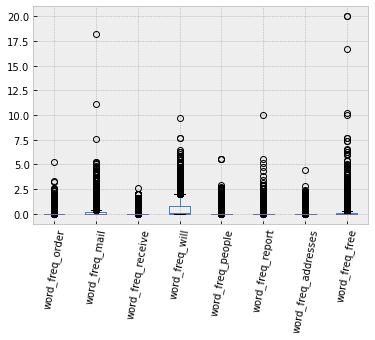

In [110]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 8:16], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.07, 0.06, 0.37, 0.31, 0.02, 0.02, 1.3, 1.17, 0.97, 0.37, 1.56, 0.72, 0.99, 0.43, 0.36, 0.36, 1.04, 0.23, 1.32, 0.61, 5.06, 0.96, 0.44, 0.2, 0.95, 1.58, 2.8, 0.44, 0.44, 0.44, 0.46, 0.12, 5.12, 2.79, 0.42, 1.68, 1.6, 0.76, 0.16, 0.19, 0.19, 0.66, 0.66, 0.42, 0.66, 1.63, 1.17, 2.82, 0.67, 1.31, 0.45, 1.7, 0.46, 0.29, 0.46, 1.24, 0.17, 0.78, 1.74, 0.53, 0.46, 0.66, 0.17, 0.54, 0.17, 0.53, 3.29, 0.77, 0.78, 0.86, 0.91, 1.23, 0.54, 1.25, 0.22, 0.22, 0.08, 0.96, 0.46, 0.32, 0.32, 0.39, 0.92, 2.98, 0.72, 0.84, 0.17, 0.32, 2.87, 0.95, 0.08, 0.69, 0.69, 2.85, 0.8, 0.33, 0.14, 0.33, 0.79, 0.5, 0.5, 0.17, 0.95, 1.63, 1.61, 0.72, 1.14, 1.79, 0.08, 0.69, 0.32, 0.54, 0.37, 1.06, 0.37, 0.64, 0.32, 0.64, 0.43, 0.72, 0.23, 0.37, 0.37, 0.32, 2.0, 1.05, 0.47, 0.25, 0.73, 0.64, 0.32, 0.63, 0.65, 0.23, 0.64, 0.73, 0.32, 0.72, 0.45, 2.32, 0.1, 0.32, 0.11, 0.32, 0.1, 0.74, 0.42, 0.24, 0.08, 0.73, 0.73, 0.44, 0.08, 0.96, 0.59, 0.44, 0.67, 0.46, 0.62, 2.93, 0.08, 0.1, 0.08, 0.87, 0.62, 1.68, 0

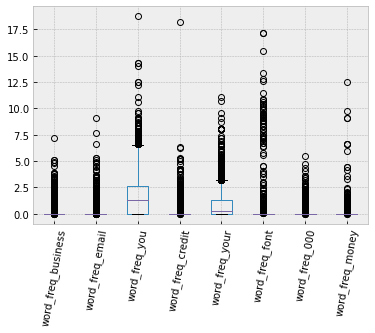

In [111]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 16:24], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.68, 0.34, 0.05, 0.05, 0.05, 0.05, 1.49, 0.21, 0.33, 0.95, 3.58, 0.95, 0.1, 0.17, 0.49, 0.19, 2.06, 0.02, 0.02, 0.71, 1.16, 0.44, 0.51, 0.04, 0.57, 0.34, 0.33, 0.32, 1.35, 0.26, 0.52, 0.09, 0.11, 0.34, 0.34, 1.46, 0.34, 0.38, 0.38, 0.38, 0.02, 1.19, 0.97, 1.18, 0.36, 0.98, 3.37, 0.7, 0.09, 0.68, 5.12, 4.08, 9.33, 0.9, 3.3, 0.8, 1.16, 1.93, 8.1, 3.47, 2.89, 16.66, 4.22, 1.58, 0.21, 0.47, 5.12, 2.63, 3.76, 1.83, 0.57, 0.33, 0.44, 3.0, 0.23, 4.5, 4.0, 0.96, 0.54, 5.68, 7.14, 0.3, 5.55, 1.96, 3.7, 2.22, 1.1, 2.32, 0.69, 1.38, 0.93, 0.75, 1.69, 0.14, 0.29, 4.54, 1.6, 3.52, 1.01, 2.48, 4.34, 0.26, 0.31, 2.89, 3.88, 0.2, 0.27, 1.34, 4.7, 4.62, 7.14, 4.0, 1.36, 2.31, 3.34, 0.62, 1.38, 1.27, 0.14, 1.69, 1.28, 3.92, 0.96, 3.33, 2.45, 5.37, 2.57, 0.19, 9.09, 0.44, 2.0, 2.08, 0.65, 0.39, 0.28, 0.62, 4.5, 0.97, 0.81, 15.38, 0.81, 1.12, 2.38, 16.66, 9.83, 0.87, 0.48, 1.81, 0.76, 0.92, 1.04, 0.93, 1.76, 3.06, 1.58, 2.77, 1.72, 1.75, 1.38, 0.86, 2.77, 1.49, 1.79, 1.61, 0.36, 1.75, 2.22

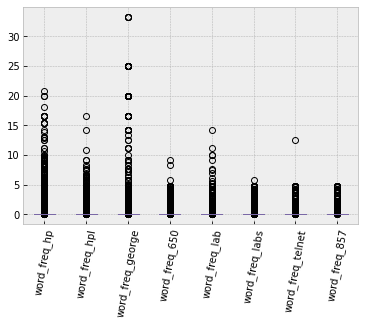

In [112]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 24:32], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.15, 0.34, 0.12, 0.59, 0.16, 0.26, 0.36, 0.25, 1.03, 0.2, 0.05, 0.14, 0.15, 0.74, 0.16, 0.47, 0.53, 0.33, 0.33, 0.34, 0.33, 0.55, 0.52, 0.44, 0.27, 0.44, 0.26, 0.4, 1.25, 0.7, 0.52, 1.13, 0.08, 2.12, 0.19, 0.45, 0.08, 0.05, 1.36, 1.25, 0.16, 1.88, 0.41, 0.26, 0.19, 0.02, 0.08, 0.08, 0.37, 0.08, 0.08, 0.32, 0.08, 1.4, 0.03, 0.48, 0.33, 0.21, 0.29, 0.33, 0.23, 0.07, 0.84, 0.34, 0.11, 0.3, 2.15, 0.05, 0.14, 0.74, 0.31, 0.25, 1.21, 0.46, 1.36, 0.9, 0.35, 0.14, 0.42, 0.06, 3.44, 1.4, 0.52, 0.57, 0.14, 0.1, 0.27, 2.43, 0.46, 0.75, 0.3, 0.55, 0.35, 0.65, 1.63, 1.58, 0.5, 0.9, 0.1, 3.06, 1.85, 0.76, 0.8, 0.44, 0.47, 0.47, 2.38, 2.13, 0.59, 0.55, 0.85, 0.08, 2.56, 2.56, 0.16, 0.29, 0.47, 1.01, 0.09, 0.69, 0.05, 2.06, 0.75, 0.77, 1.57, 0.67, 0.15, 1.17, 0.69, 2.0, 2.04, 0.65, 2.0, 0.09, 0.23, 3.73, 1.19, 1.66, 2.86, 2.0, 2.0, 1.19, 0.46, 0.74, 0.69, 1.04, 0.03, 1.4, 1.15, 0.43, 0.12, 0.26, 0.7, 0.37, 0.74, 0.82, 0.61, 1.84, 0.72, 0.11, 0.27, 2.8, 4.16, 0.71, 0.61, 0.45, 4.25, 1.0

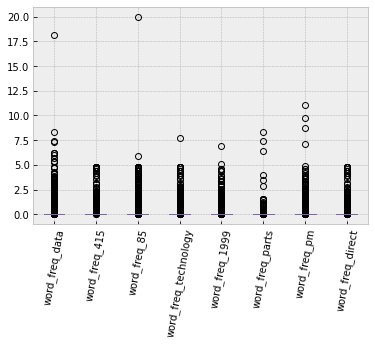

In [113]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 32:40], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.1, 2.32, 0.54, 0.39, 7.14, 3.22, 0.51, 7.14, 7.14, 1.16, 7.14, 0.13, 0.89, 0.25, 0.76, 0.34, 1.38, 0.33, 0.08, 3.25, 0.59, 1.24, 0.18, 0.17, 1.3, 3.26, 0.31, 0.19, 0.31, 0.65, 0.25, 1.56, 3.12, 1.44, 1.62, 0.68, 4.75, 4.75, 4.75, 1.44, 1.29, 0.06, 2.31, 0.36, 0.04, 1.01, 0.26, 0.36, 0.16, 2.0, 1.01, 0.94, 1.4, 0.13, 0.29, 0.28, 0.31, 0.71, 3.07, 0.03, 2.11, 0.2, 0.61, 0.28, 1.58, 0.35, 0.37, 2.5, 2.56, 0.56, 5.0, 0.46, 2.8, 1.16, 5.88, 2.22, 2.26, 1.7, 0.89, 1.35, 1.92, 1.94, 1.72, 2.0, 0.34, 0.1, 0.51, 0.92, 0.8, 0.65, 0.31, 0.31, 0.1, 1.35, 0.06, 0.52, 1.26, 0.38, 0.98, 0.75, 1.98, 0.32, 0.69, 0.16, 0.07, 0.02, 0.93, 2.56, 2.83, 1.69, 1.33, 0.84, 2.81, 2.15, 0.86, 1.44, 0.34, 1.06, 1.58, 0.81, 1.8, 1.66, 0.19, 1.28, 0.86, 0.23, 0.08, 0.62, 0.6, 0.25, 1.06, 1.2, 1.17, 0.44, 4.28, 2.69, 0.53, 1.88, 1.92, 0.21, 1.02, 0.42, 0.46, 0.37, 4.76, 0.61, 0.68, 0.62], [0.13, 0.06, 0.23, 0.34, 0.11, 0.11, 0.06, 0.11, 0.11, 0.18, 0.03, 0.25, 0.45, 0.45, 0.32, 0.35, 0.38, 0.37, 0.3

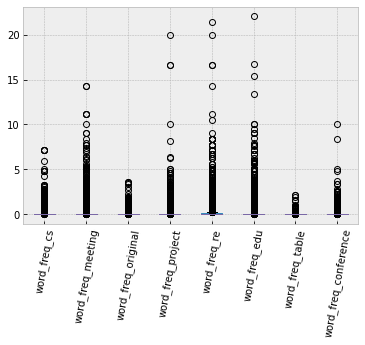

In [114]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 40:48], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[0.01, 0.04, 0.022000000000000002, 0.042, 0.40399999999999997, 0.042, 0.436, 0.335, 0.355, 0.01, 0.036000000000000004, 0.04, 0.061, 0.043, 0.069, 0.021, 0.004, 0.207, 0.094, 0.305, 0.094, 0.305, 0.094, 0.305, 0.115, 0.305, 0.019, 0.011000000000000001, 0.046, 0.011000000000000001, 0.063, 0.147, 0.14, 0.011000000000000001, 0.011000000000000001, 0.053, 0.064, 0.049, 0.027999999999999997, 0.01, 0.01, 0.075, 0.17, 0.17, 0.1, 0.01, 0.009000000000000001, 0.005, 0.078, 0.01, 0.01, 0.012, 0.019, 0.013999999999999999, 0.044000000000000004, 0.012, 0.055999999999999994, 0.044000000000000004, 0.451, 0.061, 0.061, 0.28300000000000003, 0.07200000000000001, 0.098, 0.012, 0.043, 0.075, 0.114, 0.015, 0.03, 0.151, 0.012, 0.071, 0.015, 0.084, 0.019, 0.067, 0.015, 0.018000000000000002, 0.21600000000000003, 0.018000000000000002, 0.215, 0.07200000000000001, 0.063, 0.062, 0.038, 0.016, 0.012, 0.045, 0.142, 0.027000000000000003, 0.09699999999999999, 0.012, 0.01, 0.063, 0.012, 0.01, 0.431, 0.496, 

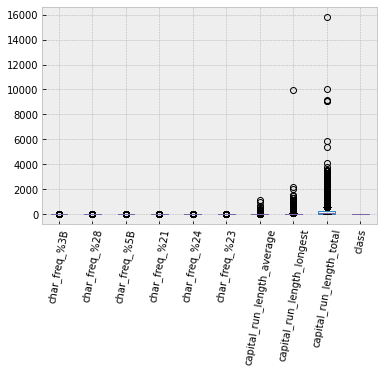

In [115]:
# Plot Outliers
#
plt.style.use('bmh')

# Checking for Outliers.
# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 48:58], return_type='both')
plt.xticks(rotation=80)

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]
print(f" Ourtliers:\n {out_list}")

In [116]:
# Dropping Outliers
#
# Getting ouliers from our dataframe using a z-test
#
from scipy import stats

z = np.abs(stats.zscore(numeric))
print(f"{z}\n")

# Dropping and Confirming that our outliers have been dropped from the dataset.
#
df_o = numeric[(z < 3).all(axis=1)]

print(f"Previous dataframe size : {numeric.shape[0]}")
print(f"New dataframe size: {df_o.shape[0]}")

[[0.34243371 0.3308849  0.71285877 ... 0.04529792 0.00872413 1.24007366]
 [0.3453594  0.05190919 0.43512954 ... 0.25056283 1.22832407 1.24007366]
 [0.14592139 0.16507191 0.85172339 ... 2.22110599 3.25873251 1.24007366]
 ...
 [0.64012787 0.16507191 0.03837349 ... 0.23694133 0.27262775 0.80640371]
 [2.80176333 0.16507191 0.55676058 ... 0.24207296 0.33860365 0.80640371]
 [0.34243371 0.16507191 0.73269658 ... 0.24207296 0.40128076 0.80640371]]

Previous dataframe size : 4601
New dataframe size: 2185


> **Observations**

> Almost every column in our dataset had some outliers, with some of the columns having a huge number of them. 

> Therefore, dropping the outliers reduces the size of our dataset from 4601 to 2185 rows.

In [117]:
# Identifying the Missing Data
#
spam.isnull().sum()

word_freq_make                0
word_freq_address             0
word_freq_all                 0
word_freq_3d                  0
word_freq_our                 0
word_freq_over                0
word_freq_remove              0
word_freq_internet            0
word_freq_order               0
word_freq_mail                0
word_freq_receive             0
word_freq_will                0
word_freq_people              0
word_freq_report              0
word_freq_addresses           0
word_freq_free                0
word_freq_business            0
word_freq_email               0
word_freq_you                 0
word_freq_credit              0
word_freq_your                0
word_freq_font                0
word_freq_000                 0
word_freq_money               0
word_freq_hp                  0
word_freq_hpl                 0
word_freq_george              0
word_freq_650                 0
word_freq_lab                 0
word_freq_labs                0
word_freq_telnet              0
word_fre

> ***The dataset does not have null values***

In [118]:
# More data cleaning procedures
#
spam.duplicated().sum()

391

In [119]:
# Dealing with duplicated values.
#
spam.drop_duplicates(inplace=True)
spam.duplicated().sum()

0

## 6. Exploratory Analysis

In [52]:
# Ploting the bivariate summaries and recording our observations
#
sns.pairplot(spam)

> Since we have 58 numeric columns then the pairplot will not be of any good to us since we can't really get meaningful information from it. The plots are many and have a very small size thus we could plot a heatmap instead.

In [122]:
# Get the correlation values of the column variables.
#
corr = numeric.corr()
corr

,word_freq_make,word_freq_address,word_freq_all,word_freq_3d,word_freq_our,word_freq_over,word_freq_remove,word_freq_internet,word_freq_order,word_freq_mail,word_freq_receive,word_freq_will,word_freq_people,word_freq_report,word_freq_addresses,word_freq_free,word_freq_business,word_freq_email,word_freq_you,word_freq_credit,word_freq_your,word_freq_font,word_freq_000,word_freq_money,word_freq_hp,word_freq_hpl,word_freq_george,word_freq_650,word_freq_lab,word_freq_labs,word_freq_telnet,word_freq_857,word_freq_data,word_freq_415,word_freq_85,word_freq_technology,word_freq_1999,word_freq_parts,word_freq_pm,word_freq_direct,word_freq_cs,word_freq_meeting,word_freq_original,word_freq_project,word_freq_re,word_freq_edu,word_freq_table,word_freq_conference,char_freq_%3B,char_freq_%28,char_freq_%5B,char_freq_%21,char_freq_%24,char_freq_%23,capital_run_length_average,capital_run_length_longest,capital_run_length_total,class
word_freq_make,1.000000,-0.016759,0.065627,0.013273,0.023119,0.059674,0.007669,-0.003950,0.106263,0.041198,0.188459,0.105801,0.066438,0.036780,0.028439,0.059386,0.081928,0.053324,0.128243,0.021295,0.197049,-0.024349,0.134072,0.188155,-0.072504,-0.061686,-0.066424,-0.048680,-0.041251,-0.052799,-0.039066,-0.032058,-0.041014,-0.027690,-0.044954,-0.054673,-0.057312,-0.007960,-0.011134,-0.036095,-0.009703,-0.026070,-0.024292,-0.022116,-0.037105,-0.034056,-0.000953,-0.017755,-0.026505,-0.021196,-0.033301,0.058292,0.117419,-0.008844,0.044491,0.061382,0.089165,0.126208
word_freq_address,-0.016759,1.000000,-0.033526,-0.006923,-0.023760,-0.024840,0.003918,-0.016280,-0.003826,0.032962,-0.006864,-0.040398,-0.018858,-0.009206,0.005330,-0.009117,-0.018370,0.033500,-0.055476,-0.015806,-0.018191,-0.008850,-0.020502,0.001984,-0.043483,-0.038211,-0.030307,-0.029221,-0.021940,-0.027508,-0.018097,-0.003326,-0.024903,-0.004303,-0.024058,-0.028198,-0.024013,-0.008922,-0.019124,-0.014821,-0.015420,-0.025177,-0.002370,-0.019739,-0.016418,-0.023858,-0.009818,-0.015747,-0.007282,-0.049837,-0.018527,-0.014461,-0.009605,0.001946,0.002083,0.000271,-0.022680,-0.030224
word_freq_all,0.065627,-0.033526,1.000000,-0.020246,0.077734,0.087564,0.036677,0.012003,0.093786,0.032075,0.048254,0.083210,0.047593,0.008552,0.122113,0.063906,0.036262,0.121923,0.139329,0.031111,0.156651,-0.035681,0.123671,0.041145,-0.087924,-0.062459,-0.108886,-0.050648,-0.057726,-0.032547,-0.038927,-0.061870,-0.054759,-0.061706,-0.048335,-0.046504,-0.067015,0.032407,-0.014809,-0.047066,-0.030956,-0.005811,-0.044325,-0.053464,-0.050664,-0.056655,0.029339,-0.026344,-0.033213,-0.016495,-0.033120,0.108140,0.087618,-0.003336,0.097398,0.107463,0.070114,0.196988
word_freq_3d,0.013273,-0.006923,-0.020246,1.000000,0.003238,-0.010014,0.019784,0.010268,-0.002454,-0.004947,-0.012976,-0.019221,-0.013199,0.012008,0.002707,0.007432,0.003470,0.019391,-0.010834,-0.005381,0.008176,0.028102,0.011368,0.035360,-0.015181,-0.013708,-0.010684,-0.010368,-0.007798,-0.010476,-0.007529,-0.006717,-0.008075,-0.006729,-0.006122,-0.006515,-0.007761,-0.002669,-0.004602,-0.007643,-0.005670,-0.008095,-0.009268,-0.005933,-0.012957,-0.009181,-0.003348,-0.001924,-0.000591,-0.012370,-0.007148,-0.003138,0.010862,-0.000298,0.005260,0.022081,0.021369,0.057371
word_freq_our,0.023119,-0.023760,0.077734,0.003238,1.000000,0.054054,0.147336,0.029598,0.020823,0.034495,0.068382,0.066788,0.031126,0.003445,0.056177,0.083024,0.143443,0.062344,0.098510,0.031526,0.136605,-0.020207,0.070037,0.000039,-0.072502,-0.075456,-0.088011,-0.061501,0.032048,-0.052066,-0.042535,-0.026748,-0.031998,-0.026960,-0.049732,-0.048844,-0.072599,0.130812,-0.042044,-0.021442,-0.047505,0.115041,-0.048879,0.015234,-0.042336,-0.077986,-0.026900,-0.032005,-0.032759,-0.046361,-0.026390,0.025509,0.041582,0.002016,0.052662,0.052290,0.002492,0.241920
word_freq_over,0.059674,-0.024840,0.087564,-0.010014,0.054054,1.000000,0.061163,0.079561,0.117438,0.013897,0.053900,0.009264,0.077631,0.009673,0.173066,0.019865,0.064137,0.078350,0.095505,0.058979,0.106833,0.007956,

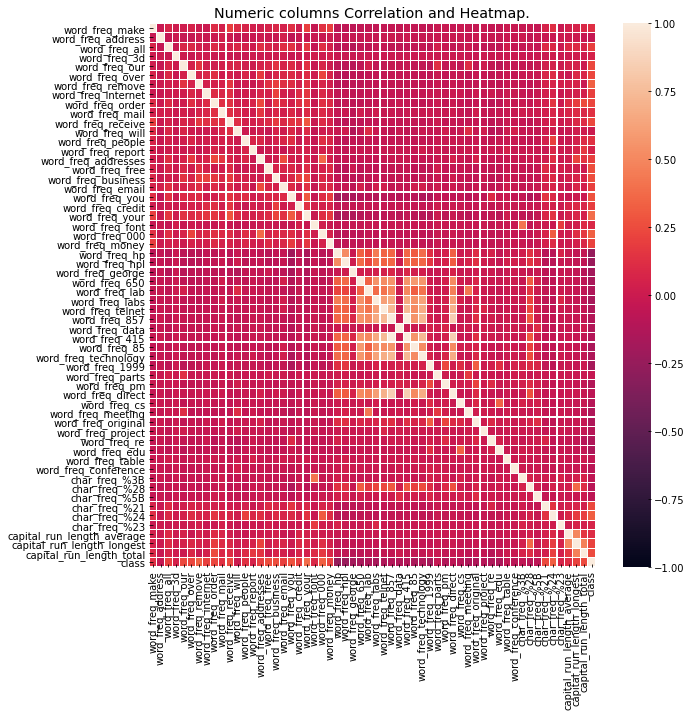

In [123]:
# Ploting the bivariate summaries and recording our observations
#
plt.figure(figsize = (10,10))
plt.title('Numeric columns Correlation and Heatmap.')
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,vmin=-1, vmax=1)
plt.show()

> Checking at the correlation between the numeric variables, we see that the variables are not highly correlated with each other.

## 7. Implementing the Solution

**We are going to implement our solution using Naive Bayes Algorithm for our model**

### Data Modeling

In [127]:
# Implementing the Solution
# ----
# Getting the target and the predictors.
#
X = spam.drop(['class'], 1)
y = spam['class']

# Scale the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [147]:
# Data Reduction
#
pca = PCA(n_components=10)

pca = pca.fit_transform(X)
pca_df = pd.DataFrame(data=pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

print(pca_df.head())

        PC1       PC2       PC3  ...       PC8       PC9      PC10
0 -0.767111  0.046198 -0.648567  ...  0.796108  1.263634  0.640614
1 -1.293163  2.002641  0.091149  ...  0.185809 -0.477400 -0.064003
2 -1.613091  4.812345  3.140774  ... -1.375769  1.338621 -0.058933
3 -0.856706  0.411947 -0.552047  ... -0.451268 -0.219004 -0.139240
4 -0.857560  0.411276 -0.554181  ... -0.452871 -0.220142 -0.139367

[5 rows x 10 columns]


#### Splitting the data into 20% as Test Data.

In [148]:
# Splitting the data into train and test
X_train, X_test, y_train,  y_test = train_test_split(pca_df, y, test_size = 0.2, random_state =0)
X.shape, y.shape

((4210, 57), (4210,))

In [149]:
# Train the model
#
model = GaussianNB()
model = model.fit(X_train, y_train)

# Predictions
#
predicted = model.predict(X_test) 

 Accuracy:               precision    recall  f1-score   support

           0       0.92      0.84      0.88       495
           1       0.79      0.90      0.84       347

    accuracy                           0.86       842
   macro avg       0.86      0.87      0.86       842
weighted avg       0.87      0.86      0.86       842


 Model Accuracy: 86.10451306413302

Predicted    0    1
Actual             
0          414   81
1           36  311


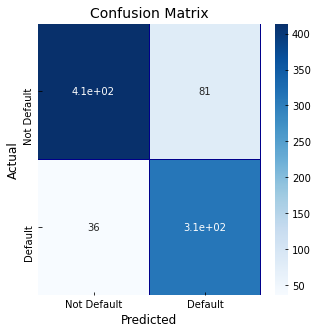

In [150]:
# Classification Report and a confusion matrix.
#
print(f" Accuracy: {metrics.classification_report(y_test, predicted)}")

cm = pd.crosstab(y_test, predicted, rownames=['Actual'], colnames=['Predicted'])

print(f"\n Model Accuracy: {metrics.accuracy_score(y_test, predicted)*100}\n")
print(cm)
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm, 
            xticklabels=['Not Default', 'Default'],
            yticklabels=['Not Default', 'Default'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Confusion Matrix', fontsize=14)
plt.show()
# 1= default
# 0 = No default

> After performing Feature reduction and working with only 10 columns our Naives Bayes performs relatively well with an accuracy of 86.1%.

#### Splitting the data into 30% as Test Data.

In [151]:
# Splitting the data into train and test
X_train, X_test, y_train,  y_test = train_test_split(pca_df, y, test_size = 0.3, random_state =0)
X.shape, y.shape

((4210, 57), (4210,))

In [152]:
# Train the model
#
model = GaussianNB()
model = model.fit(X_train, y_train)

# Predictions
#
predicted = model.predict(X_test) 

 Accuracy:               precision    recall  f1-score   support

           0       0.92      0.84      0.88       737
           1       0.80      0.90      0.85       526

    accuracy                           0.87      1263
   macro avg       0.86      0.87      0.87      1263
weighted avg       0.87      0.87      0.87      1263


 Model Accuracy: 86.77751385589866

Predicted    0    1
Actual             
0          621  116
1           51  475


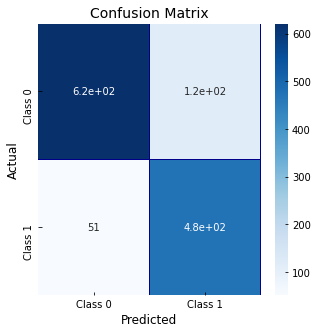

In [153]:
# Classification Report and a confusion matrix.
#
print(f" Accuracy: {metrics.classification_report(y_test, predicted)}")


print(f"\n Model Accuracy: {metrics.accuracy_score(y_test, predicted)*100}\n")

cm = pd.crosstab(y_test, predicted, rownames=['Actual'], colnames=['Predicted'])

print(cm)
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm, 
            xticklabels=['Class 0', 'Class 1'],
            yticklabels=['Class 0', 'Class 1'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Confusion Matrix', fontsize=14)
plt.show()
# 1= default
# 0 = No default

> Using test data size of 40% the original data gives us an accuracy of 86.8%.

> The corect positive predictions increase from 414 to 621, while the correct negative predictions increase from 311 to 475.

> The True Positive Error also increases from 36 to 51 while the True Negative Error increases fro 81 to 116.

> Therefore we can say that the model performance improves when the test size increase but in return the number of misclassified variables which were classified as ***class 0*** instead of being classified as ***class 1*** increased by a huge margin, 58 to be exact.

#### Splitting the data into 40% as Test Data.

In [155]:
# Splitting the data into train and test
X_train, X_test, y_train,  y_test = train_test_split(pca_df, y, test_size = 0.4, random_state =0)
X.shape, y.shape

((4210, 57), (4210,))

In [156]:
# Train the model
#
model = GaussianNB()
model = model.fit(X_train, y_train)

# Predictions
#
predicted = model.predict(X_test) 

 Accuracy:               precision    recall  f1-score   support

           0       0.94      0.75      0.83       994
           1       0.72      0.93      0.81       690

    accuracy                           0.82      1684
   macro avg       0.83      0.84      0.82      1684
weighted avg       0.85      0.82      0.82      1684


 Model Accuracy: 82.18527315914488

Predicted    0    1
Actual             
0          744  250
1           50  640


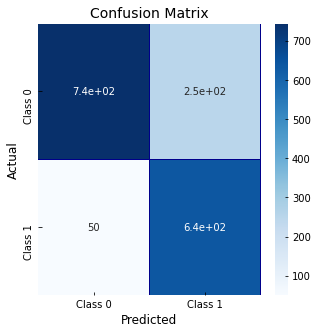

In [157]:
# Classification Report and a confusion matrix.
#
print(f" Accuracy: {metrics.classification_report(y_test, predicted)}")


print(f"\n Model Accuracy: {metrics.accuracy_score(y_test, predicted)*100}\n")

cm = pd.crosstab(y_test, predicted, rownames=['Actual'], colnames=['Predicted'])

print(cm)
fig, (ax1) = plt.subplots(ncols=1, figsize=(5,5))
sns.heatmap(cm, 
            xticklabels=['Class 0', 'Class 1'],
            yticklabels=['Class 0', 'Class 1'],
            annot=True,ax=ax1,
            linewidths=.2,linecolor="Darkblue", cmap="Blues")
plt.title('Confusion Matrix', fontsize=14)
plt.show()
# 1= default
# 0 = No default

> When we split the data into 40% test data the model perfomance reduces to having an accuracy of 82.19%


## Conclusion
> **I would advice against using a test size of 40% of the data since the model perfomance will reduce by a good margin.***

> **Hence I would advice to us a test size of 30% of the data since it gives the best model performance with an accuracy of 86.8%.**

> **However using a test size of 20% the data give you a relatively good accuracy result of 86.1%, which is just 0.7% away from 86.8% using 30% as the test size.**

> **Therefore I would recommend using a test size that ranges between 30% and 20% to get the best nmodel performance.**


## 8. Challenging the solution

> The easy solution is nice because it is, well, easy, but you should never allow those results to hold the day. You should always be thinking of ways to challenge the results, especially if those results comport with your prior expectation.






In [ ]:
# Reviewing the Solution 
#

## 9. Follow up questions

> At this point, we can refine our question or collect new data, all in an iterative process to get at the truth.



### a). Did we have the right data?

### b). Do we need other data to answer our question?

### c). Did we have the right question?